In [1]:
%%html
<link rel="stylesheet" type="text/css" href="rise.css" />

In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%config InlineBackend.figure_format = 'retina'
plt.style.use('bmh')
plt.rcParams['lines.markeredgecolor'] = 'w'
plt.rcParams['lines.markeredgewidth'] = 0.5
plt.rcParams['figure.figsize'] = [10, 6]

# Clustering
**Learning goals**
- You will appreciate that each clustering algorithm has its own pros and cons.
- You will understand and be able to use several different clustering algorithms to segregate data.
- You will be able to use several different empirical metrics to tune your model hyperparameters.
- You will be able to use the empirical Bayesian Information Criterion to decide the optimal number of clusters for a Gaussian Mixture Model.

### $k$-means clustering

1. Choose the number of clusters to use.
2. Choose a random center for each cluster.
3. Put each data point into the cluster whose center it is closest to.
4. Update the cluster centers to the mean of all points in the cluster.
5. Repeat 2-3 until cluster centers converge (i.e. don't change much anymore).

![kmeans EM algorithm](images/kmeans_EM.png "kmeans EM algorithm")

Generate some toy data to cluster...

array([0, 1, 2, 3])

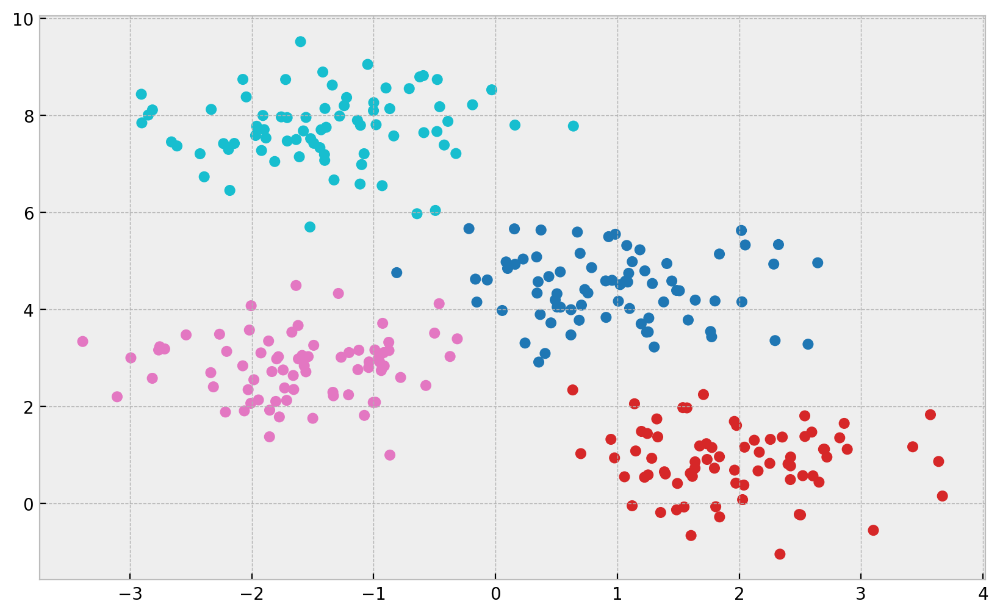

In [433]:
from sklearn.datasets import make_blobs

X, y = make_blobs(n_samples=300, centers=4, cluster_std=0.70, random_state=0)

plt.scatter(X[:,0], X[:,1], c=y, cmap='tab10')

np.unique(y)

Cluster the above data using k-means.

In [163]:
from sklearn.cluster import KMeans

model = KMeans(n_clusters=4, random_state=0)

labels = model.fit_predict(X)
labels

array([1, 2, 0, 2, 1, 1, 3, 0, 2, 2, 3, 2, 0, 2, 1, 0, 0, 1, 3, 3, 1, 1,
       0, 3, 3, 0, 1, 0, 3, 0, 2, 2, 0, 2, 2, 2, 2, 2, 3, 1, 0, 3, 0, 0,
       3, 3, 2, 3, 2, 1, 3, 1, 2, 1, 1, 3, 2, 3, 2, 1, 2, 0, 2, 3, 3, 3,
       2, 1, 2, 3, 0, 3, 2, 3, 3, 2, 3, 0, 1, 2, 1, 0, 1, 1, 2, 0, 1, 0,
       2, 2, 0, 1, 2, 3, 3, 0, 1, 1, 0, 3, 2, 1, 2, 1, 0, 1, 1, 0, 2, 0,
       3, 3, 1, 2, 1, 0, 2, 1, 1, 0, 3, 1, 3, 1, 1, 1, 1, 3, 1, 3, 2, 3,
       3, 1, 2, 3, 3, 2, 0, 2, 2, 3, 0, 3, 0, 3, 2, 0, 2, 2, 2, 0, 2, 0,
       1, 3, 2, 3, 1, 0, 2, 0, 0, 1, 0, 3, 3, 0, 1, 0, 0, 2, 1, 0, 3, 2,
       1, 1, 0, 3, 1, 0, 3, 3, 0, 0, 0, 0, 1, 2, 0, 3, 0, 0, 3, 3, 3, 0,
       3, 2, 0, 3, 1, 3, 0, 2, 3, 2, 0, 2, 0, 3, 0, 0, 2, 3, 3, 1, 1, 0,
       2, 1, 1, 3, 1, 3, 0, 2, 2, 0, 0, 2, 0, 1, 3, 0, 1, 3, 2, 3, 1, 0,
       1, 2, 2, 2, 2, 3, 3, 2, 0, 3, 1, 0, 3, 3, 0, 1, 1, 2, 0, 0, 3, 1,
       2, 3, 0, 2, 0, 1, 1, 3, 3, 0, 1, 1, 1, 0, 2, 2, 1, 1, 0, 1, 1, 1,
       2, 3, 2, 0, 1, 1, 2, 2, 2, 1, 1, 0, 2, 3], d

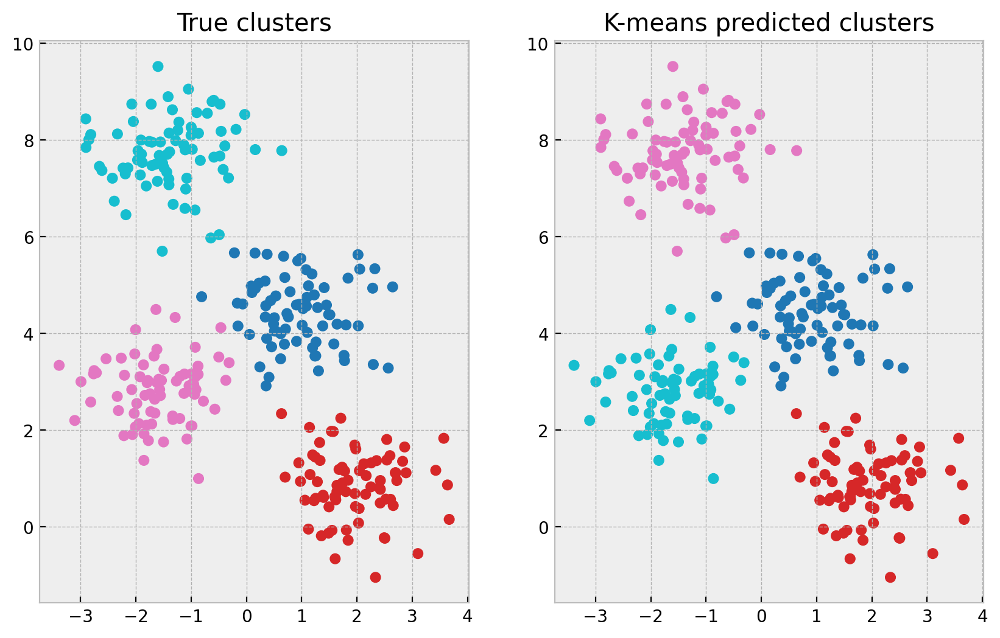

In [164]:
plt.subplot(1, 2, 1)
plt.scatter(X[:,0], X[:,1], c=y, cmap='tab10')
plt.title('True clusters')

plt.subplot(1, 2, 2)
plt.scatter(X[:,0], X[:,1], c=labels, cmap='tab10')
plt.title('K-means predicted clusters');

### Exercise
Use k-means to cluster the above data using each of 2-5 clusters.

Plot the resulting clusters for each case side-by-side.

In [ ]:
# plt.figure(figsize=[10, 4])
# for i, n in enumerate(range(2, 6)):
#     model = ...
#     labels = ...
#     plt.subplot(1, 4, i + 1)
#     plt.scatter(X[:,0], X[:,1], c=..., cmap='tab10')
#     plt.title(f'{n} clusters')
# plt.tight_layout();

### Exercise key
Use k-means to cluster the above data using each of 2-5 clusters.

Plot the resulting clusters for each case side-by-side.

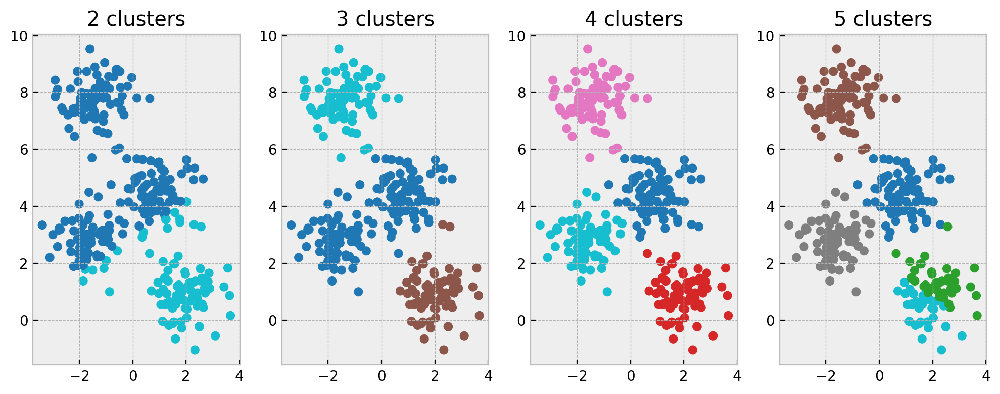

In [436]:
plt.figure(figsize=[10, 4])
for i, n in enumerate(range(2, 6)):
    model = KMeans(n_clusters=n, random_state=0)
    labels = model.fit_predict(X)
    plt.subplot(1, 4, i + 1)
    plt.scatter(X[:,0], X[:,1], c=labels, cmap='tab10')
    plt.title(f'{n} clusters')
plt.tight_layout();

What if you're not sure how many clusters to use?

There is no method that will tell you for sure exactly how many clusters to use.

However, there are empirical methods that can lend support for a given number of clusters.

### Silhouette Score

Silhouette Score = (b-a) / max(a,b)

* a: average distance between each point within a cluster
* b: average distance between clusters

Ranges from -1 (clusters poorly separated) to +1 (clusters well separated)

![](images/silhouette-score.jpeg)

Try various k-means models with different numbers of clusters and choose the one with the maximum Silhouette score.

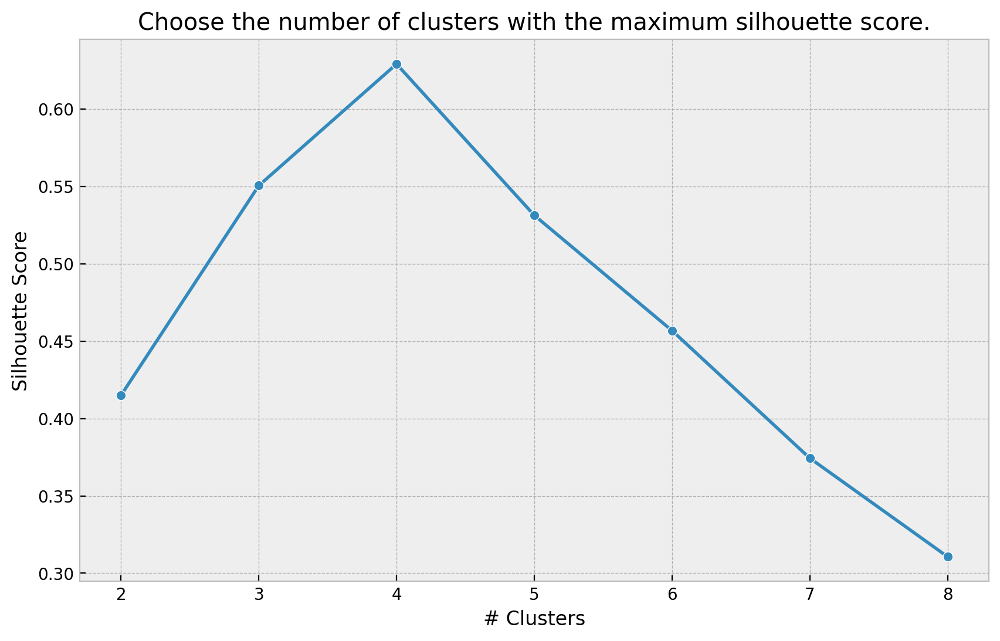

In [165]:
from sklearn.metrics import silhouette_score

n_clusters = np.arange(2, 9)
scores = []

for n in n_clusters:
    model = KMeans(n_clusters=n, random_state=0)
    labels = model.fit_predict(X)
    score = silhouette_score(X, labels)
    scores.append(score)

plt.plot(n_clusters, scores, 'o-')
plt.xlabel('# Clusters')
plt.ylabel('Silhouette Score')
plt.title('Choose the number of clusters with the maximum silhouette score.');

That was obvious anyway, so let's generate some less distinct clusters and try this again.

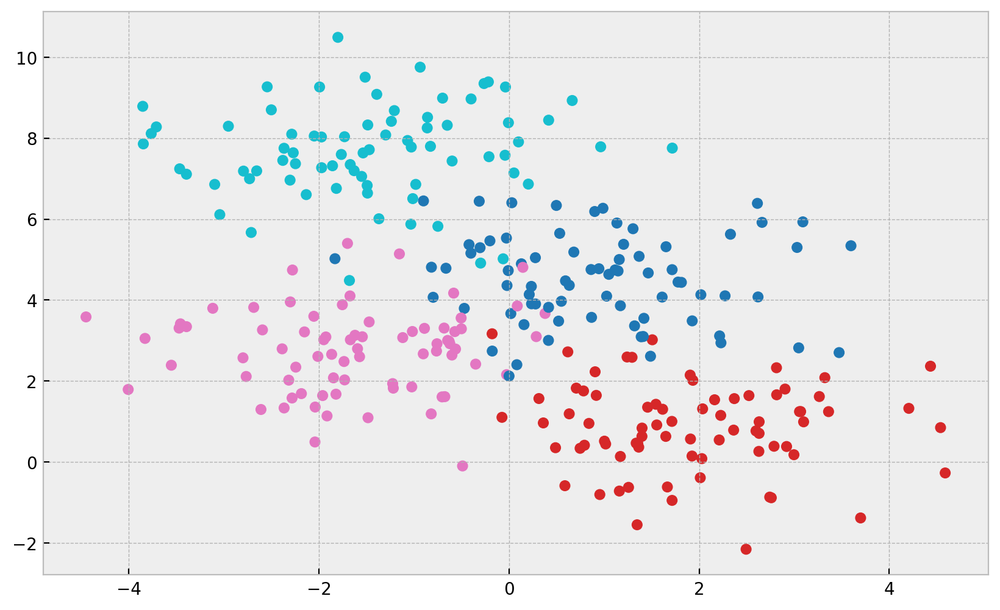

In [171]:
X, y = make_blobs(n_samples=300, centers=4, cluster_std=1.1, random_state=0)

plt.scatter(X[:,0], X[:,1], c=y, cmap='tab10');

### Exercise
Use silhouette score to determine the optimal number of k-means clusters.

In [ ]:
# n_clusters = np.arange(2, 9)
# scores = []

# for n in n_clusters:
#     model = ...
#     labels = ...
#     score = ...
#     scores.append(score)

# plt.plot(n_clusters, scores, 'o-')
# plt.xlabel('# Clusters')
# plt.ylabel('Silhouette Score')
# plt.title('Choose the number of clusters with the maximum silhouette score.');

### Exercise key
Use silhouette score to determine the optimal number of k-means clusters.

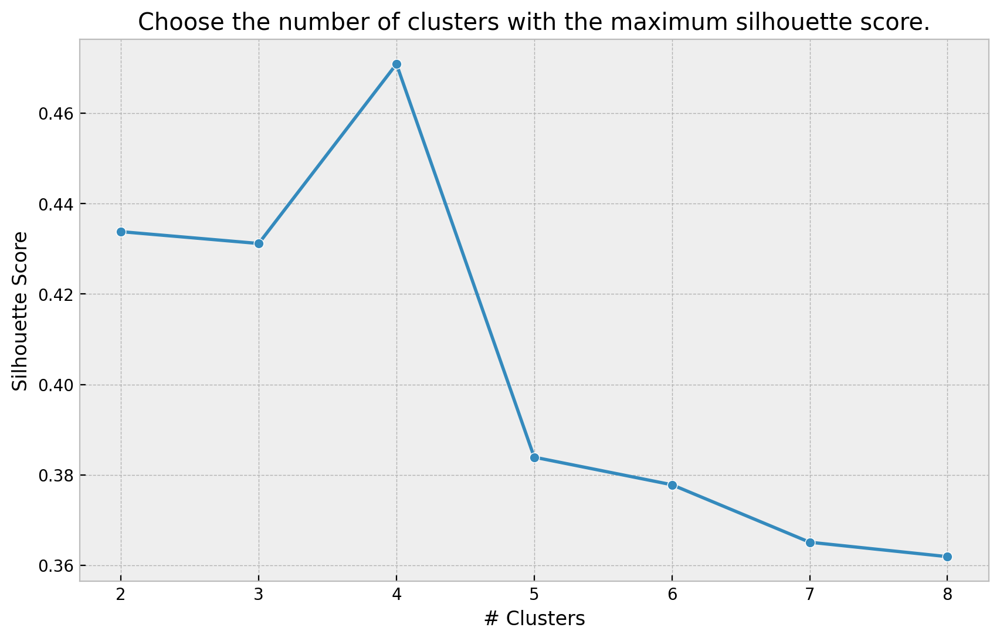

In [173]:
n_clusters = np.arange(2, 9)
scores = []

for n in n_clusters:
    model = KMeans(n_clusters=n, random_state=0)
    labels = model.fit_predict(X)
    score = silhouette_score(X, labels)
    scores.append(score)

plt.plot(n_clusters, scores, 'o-')
plt.xlabel('# Clusters')
plt.ylabel('Silhouette Score')
plt.title('Choose the number of clusters with the maximum silhouette score.');

In [174]:
model = KMeans(n_clusters=4, random_state=0)
labels = model.fit_predict(X)

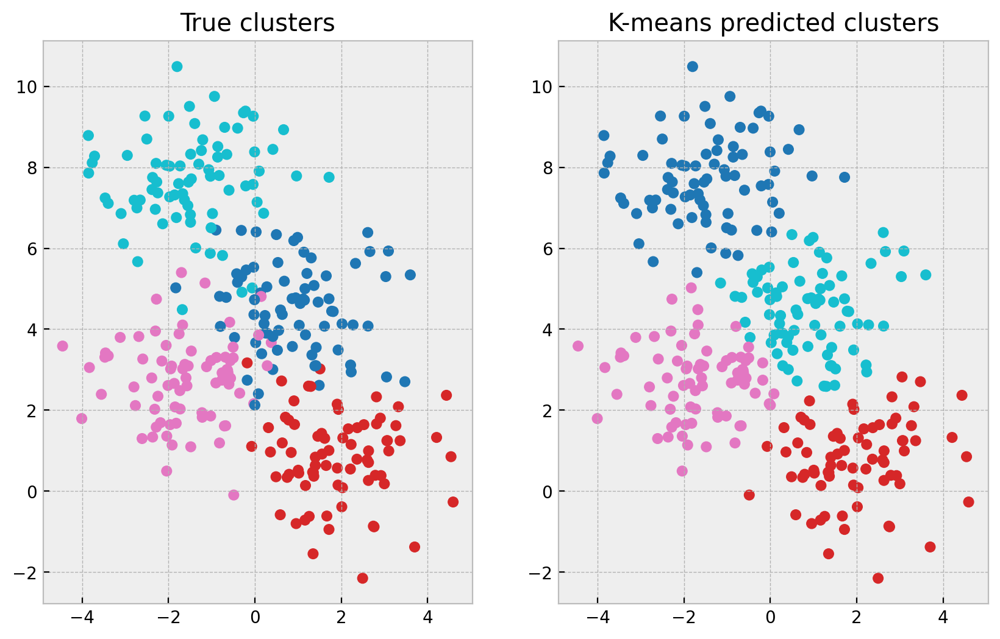

In [175]:
plt.subplot(1, 2, 1)
plt.scatter(X[:,0], X[:,1], c=y, cmap='tab10')
plt.title('True clusters')

plt.subplot(1, 2, 2)
plt.scatter(X[:,0], X[:,1], c=labels, cmap='tab10')
plt.title('K-means predicted clusters');

Let's look at some real data that is less "blobby".

In [176]:
import pandas as pd
df = pd.read_csv('data/Data_Cortex_Nuclear.csv')
df

,MouseID,DYRK1A_N,ITSN1_N,BDNF_N,NR1_N,NR2A_N,pAKT_N,pBRAF_N,pCAMKII_N,pCREB_N,...,pCFOS_N,SYP_N,H3AcK18_N,EGR1_N,H3MeK4_N,CaNA_N,Genotype,Treatment,Behavior,class
0,309_1,0.503644,0.747193,0.430175,2.816329,5.990152,0.218830,0.177565,2.373744,0.232224,...,0.108336,0.427099,0.114783,0.131790,0.128186,1.675652,Control,Memantine,C/S,c-CS-m
1,309_2,0.514617,0.689064,0.411770,2.789514,5.685038,0.211636,0.172817,2.292150,0.226972,...,0.104315,0.441581,0.111974,0.135103,0.131119,1.743610,Control,Memantine,C/S,c-CS-m
2,309_3,0.509183,0.730247,0.418309,2.687201,5.622059,0.209011,0.175722,2.283337,0.230247,...,0.106219,0.435777,0.111883,0.133362,0.127431,1.926427,Control,Memantine,C/S,c-CS-m
3,309_4,0.442107,0.617076,0.358626,2.466947,4.979503,0.222886,0.176463,2.152301,0.207004,...,0.111262,0.391691,0.130405,0.147444,0.146901,1.700563,Control,Memantine,C/S,c-CS-m
4,309_5,0.434940,0.617430,0.358802,2.365785,4.718679,0.213106,0.173627,2.134014,0.192158,...,0.110694,0.434154,0.118481,0.140314,0.148380,1.839730,Control,Memantine,C/S,c-CS-m
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1075,J3295_11,0.254860,0.463591,0.254860,2.092082,2.600035,0.211736,0.171262,2.483740,0.207317,...,0.183324,0.374088,0.318782,0.204660,0.328327,1.364823,Ts65Dn,Saline,S/C,t-SC-s
1076,J3295_12,0.272198,0.474163,0.251638,2.161390,2.801492,0.251274,0.182496,2.512737,0.216339,...,0.175674,0.375259,0.325639,0.200415,0.293435,1.364478,Ts65Dn,Saline,S/C,t-SC-s
1077,J3295_13,0.228700,0.395179,0.234118,1.733184,2.220852,0.220665,0.161435,1.989723,0.185164,...,0.158296,0.422121,0.321306,0.229193,0.355213,1.430825,Ts65Dn,Saline,S/C,t-SC-s
1078,J3295_14,0.221242,0.412894,0.243974,1.876347,2.384088,0.208897,0.173623,2.086028,0.192044,...,0.196296,0.397676,0.335936,0.251317,0.365353,1.404031,Ts65Dn,Saline,S/C,t-SC-s


For ease of visualization, let's just look at two proteins...

In [180]:
df2 = df[['APP_N', 'SOD1_N', 'Genotype', 'Treatment', 'Behavior', 'class']].dropna()
df2

,APP_N,SOD1_N,Genotype,Treatment,Behavior,class
0,0.453910,0.369510,Control,Memantine,C/S,c-CS-m
1,0.430940,0.342279,Control,Memantine,C/S,c-CS-m
2,0.423187,0.343696,Control,Memantine,C/S,c-CS-m
3,0.410615,0.344509,Control,Memantine,C/S,c-CS-m
4,0.398550,0.329126,Control,Memantine,C/S,c-CS-m
...,...,...,...,...,...,...
1075,0.372216,0.820078,Ts65Dn,Saline,S/C,t-SC-s
1076,0.360990,0.854258,Ts65Dn,Saline,S/C,t-SC-s
1077,0.309978,0.661809,Ts65Dn,Saline,S/C,t-SC-s
1078,0.341172,0.698413,Ts65Dn,Saline,S/C,t-SC-s


We can use `seaborn` to quickly visualize these data...

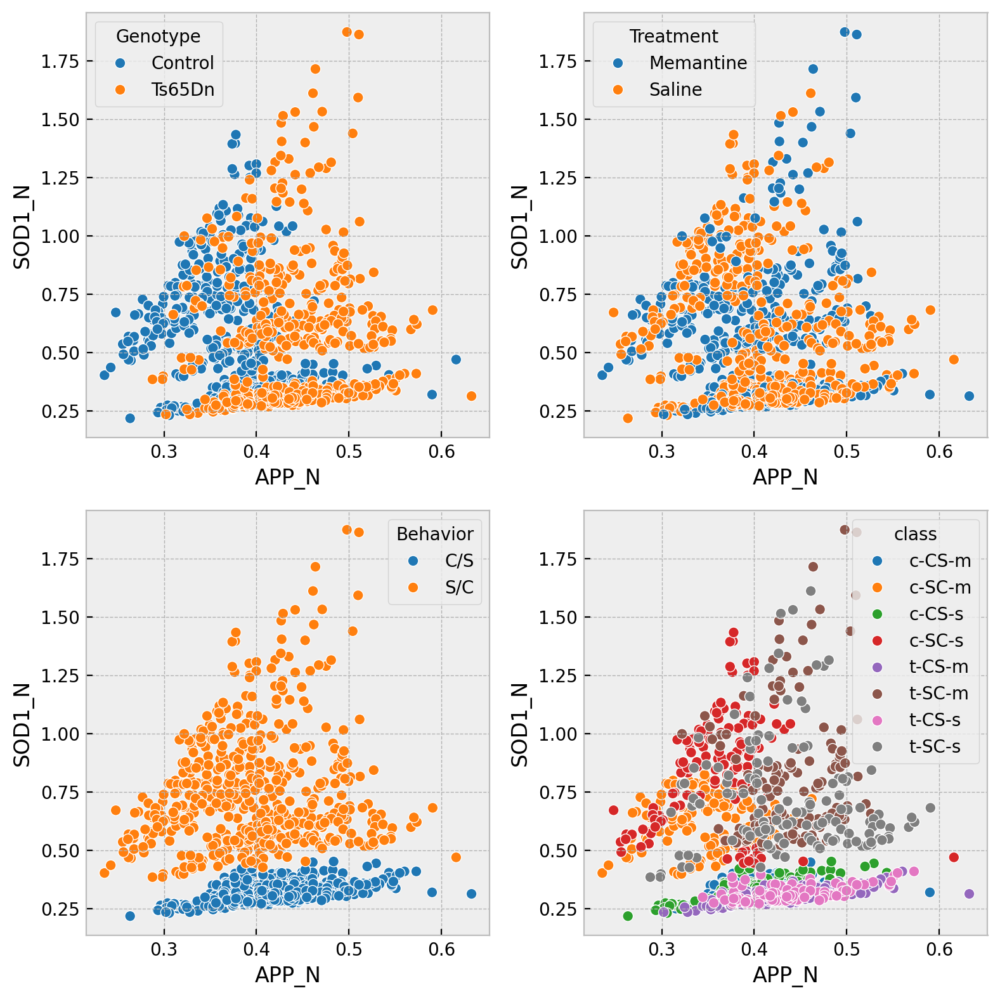

In [394]:
import seaborn as sns

fig, axes = plt.subplots(2, 2, figsize=[8,8])
for ax, col in zip(axes.reshape(-1), ['Genotype', 'Treatment', 'Behavior', 'class']):
    sns.scatterplot(df2, x='APP_N', y='SOD1_N', hue=col, ax=ax, palette='tab10')
plt.tight_layout();

*APP* and *SOD1* expression are a good preidctor of *Behavior*, but less useful for predicting *Genotype* or *Treatment*.

Let's see if a k-means model can group the mice in a way that is predictive of their *Behavior* training.

In [202]:
X = df2[['APP_N', 'SOD1_N']]

# chose 2 clusters to compare to two Behavior training paradigms
model = KMeans(n_clusters=2, random_state=0)
labels = model.fit_predict(X)

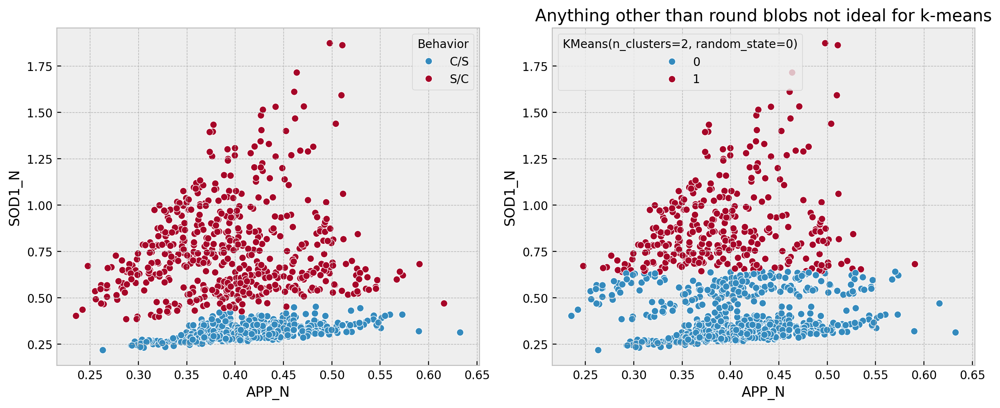

In [203]:
# add k-means cluster predictions to dataframe
df2[model] = labels

fig, ax = plt.subplots(1, 2, figsize=[12,5])
sns.scatterplot(df2, x='APP_N', y='SOD1_N', hue='Behavior', ax=ax[0], palette='tab10')
sns.scatterplot(df2, x='APP_N', y='SOD1_N', hue=model, ax=ax[1], palette='tab10')
ax[1].set_title('Anything other than round blobs not ideal for k-means')
plt.tight_layout();

This may not make sense given that we know there are two *Behavior* training paradigms, but just for fun let's see how many clusters Silhouette score thinks are in the data.

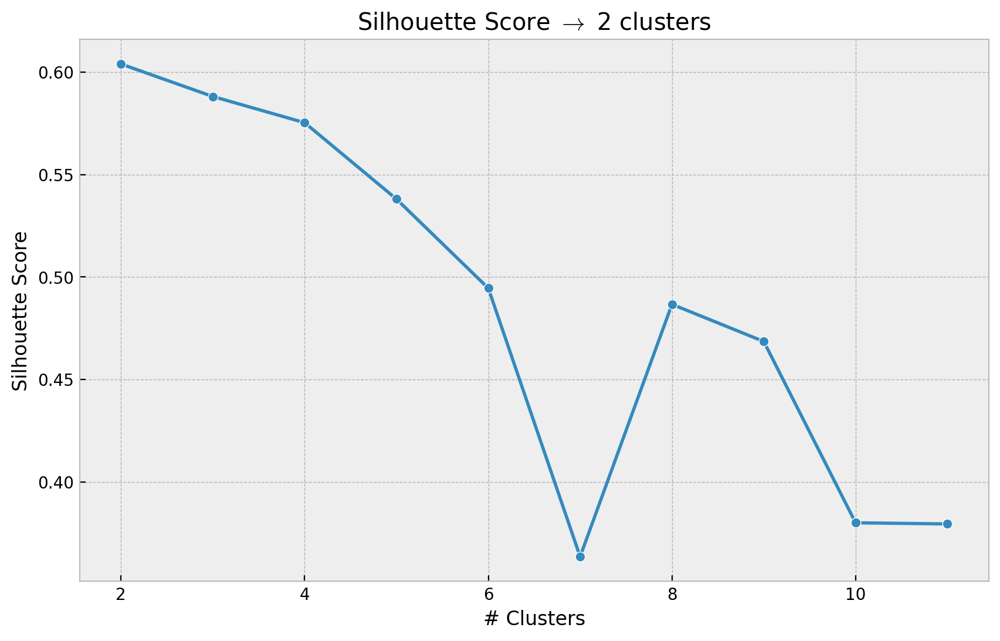

In [204]:
n_clusters = np.arange(2, 12)
scores = []

for n in n_clusters:
    model = KMeans(n_clusters=n, random_state=0)
    labels = model.fit_predict(X)
    score = silhouette_score(X, labels)
    scores.append(score)

plt.plot(n_clusters, scores, 'o-')
plt.xlabel('# Clusters')
plt.ylabel('Silhouette Score')
plt.title(r'Silhouette Score $\rightarrow$ 2 clusters');

Given that the visual clustering in APP vs. SOD1 data is more elongated than round, let's use a different clustering algorithm that can handle elliptical blobs.

### Gaussian Mixture Model (GMM)

* Need to specify the number of clusters.
* Unlike $k$-means which is primarily for round (e.g. circular) blobs, GMMs can fit eliptical blobs.

![GMM](images/gmm.gif "GMM")

Unlike k-means, GMM clusters can overlap.

![overlap clusters](images/overlapping_gaussians.png "Overlapping Clusters")

Each data point has a probability to belong to each cluster.

![overlap GMM](images/overlapping_gaussians2.png "Overlapping GMM")

In [213]:
from sklearn.mixture import GaussianMixture

X = df2[['APP_N', 'SOD1_N']]

model = GaussianMixture(n_components=2, random_state=0)
labels = model.fit_predict(X)

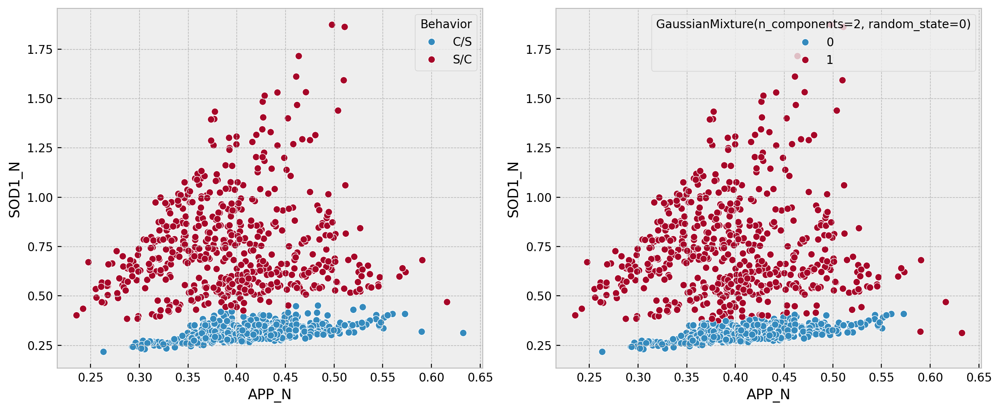

In [214]:
# add GMM cluster predictions to dataframe
df2[model] = labels

fig, ax = plt.subplots(1, 2, figsize=[12,5])
sns.scatterplot(df2, x='APP_N', y='SOD1_N', hue='Behavior', ax=ax[0], palette='tab10')
sns.scatterplot(df2, x='APP_N', y='SOD1_N', hue=model, ax=ax[1], palette='tab10')
plt.tight_layout();

Probability of each data point belonging to each custer.

In [215]:
proba = model.predict_proba(X)

proba.round(3)

array([[0.915, 0.085],
       [0.959, 0.041],
       [0.952, 0.048],
       ...,
       [0.   , 1.   ],
       [0.   , 1.   ],
       [0.   , 1.   ]])

This may not make sense given that we know there are two *Behavior* training paradigms, but just for fun let's see how many clusters Silhouette score thinks are in the data.

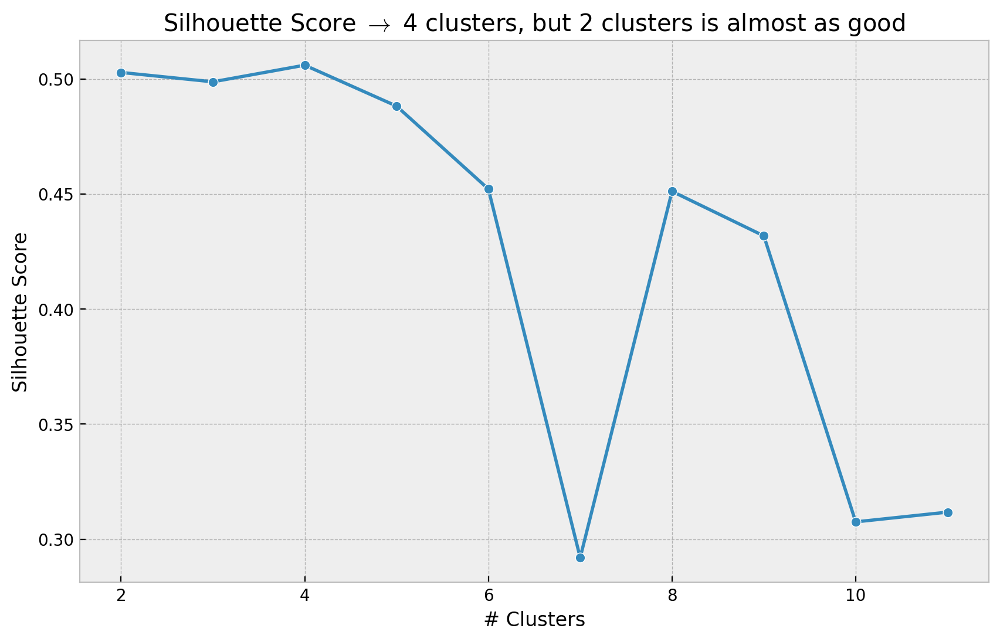

In [219]:
n_clusters = np.arange(2, 12)
scores = []

for n in n_clusters:
    model = GaussianMixture(n_components=n, random_state=0)
    labels = model.fit_predict(X)
    score = silhouette_score(X, labels)
    scores.append(score)

plt.plot(n_clusters, scores, 'o-')
plt.xlabel('# Clusters')
plt.ylabel('Silhouette Score')
plt.title(r'Silhouette Score $\rightarrow$ 4 clusters, but 2 clusters is almost as good');

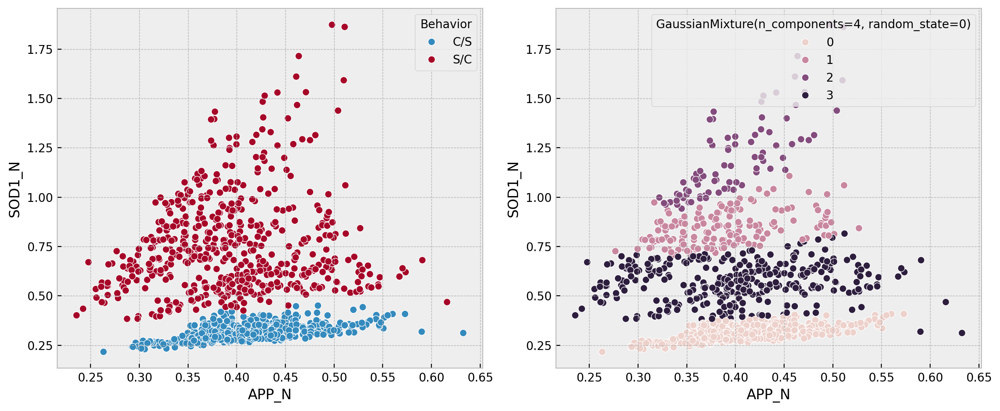

In [218]:
model = GaussianMixture(n_components=4, random_state=0)
labels = model.fit_predict(X)
df2[model] = labels

fig, ax = plt.subplots(1, 2, figsize=[12,5])
sns.scatterplot(df2, x='APP_N', y='SOD1_N', hue='Behavior', ax=ax[0], palette='tab10')
sns.scatterplot(df2, x='APP_N', y='SOD1_N', hue=model, ax=ax[1], palette='tab10')
plt.tight_layout();

Instead of *Silhouette score*, you could try several other empirical metrics such as *Calinski-Harabasz score* or *Davies-Bouldin score*.

**However, unlike k-means, GMM provides a measure for the probability of belonging to each cluster.**

This allows us to use other likelihood-based empirical metrics such as *Bayesian Information Criterion* as evidence for a given number of clusters.

*!!! None of these metrics are gauranteed to return the true number of clusters*, they simply each have their own way for estimating it. Which one is best can depend on the dataset, or you may want to try several and see if there is any sort of consensus.

### Bayesian Information Criterion (BIC)

$BIC = ln(n) * k - 2 * ln(L)$

* $k$ = number of model parameters (Gaussian centers, standard deviations, and rotations)
* $n$ = number of data points
* $L$ = likelihood of the model given the data

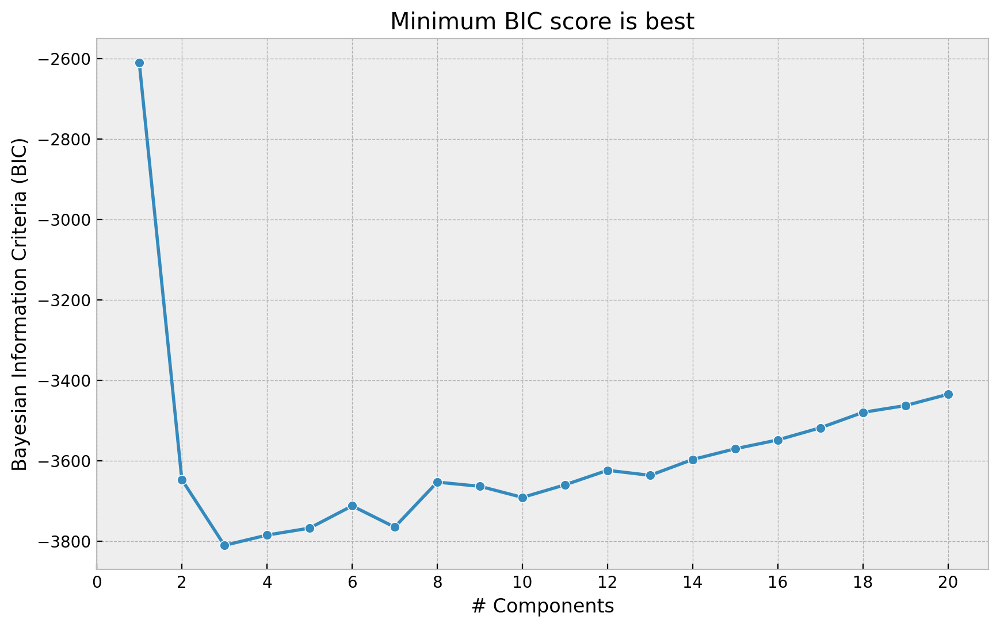

In [221]:
n_components = np.arange(1, 21)
scores = []

for n in n_components:
    model = GaussianMixture(n_components=n, random_state=0)
    model.fit(X)
    score = model.bic(X)
    scores.append(score)

plt.plot(n_components, scores, 'o-')
plt.xticks(range(0, 21, 2))
plt.xlabel('# Components');
plt.ylabel('Bayesian Information Criteria (BIC)')
plt.title('Minimum BIC score is best');

In [223]:
best_index = np.argmin(scores)
best_n = n_components[best_index]
best_n

3

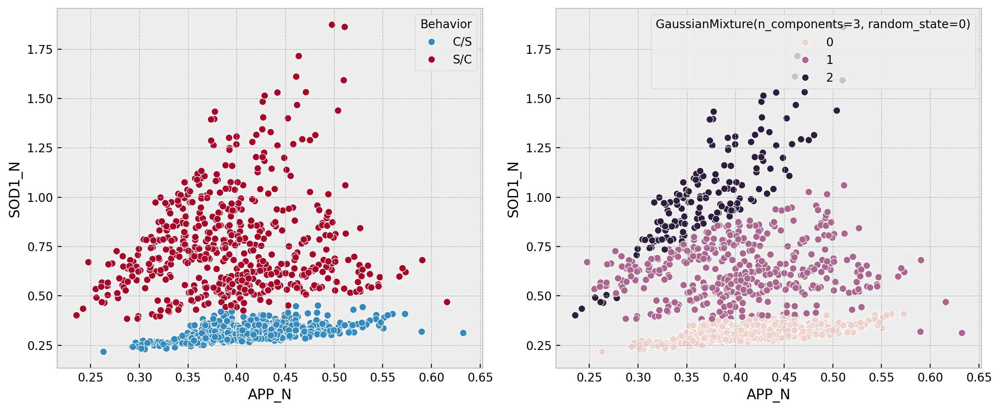

In [224]:
model = GaussianMixture(n_components=best_n, random_state=0)
labels = model.fit_predict(X)
df2[model] = labels

fig, ax = plt.subplots(1, 2, figsize=[12,5])
sns.scatterplot(df2, x='APP_N', y='SOD1_N', hue='Behavior', ax=ax[0], palette='tab10')
sns.scatterplot(df2, x='APP_N', y='SOD1_N', hue=model, ax=ax[1], palette='tab10')
plt.tight_layout();

### No clustering algorithm is perfect for everything. You'll have to assess the pros and cons based on your data.

Here are examples of how several algorithms perform on various types of data.

Some handy info on these methods at https://scikit-learn.org/stable/modules/clustering.html#overview-of-clustering-methods

Code at https://scikit-learn.org/stable/auto_examples/cluster/plot_cluster_comparison.html

![clustering algorithms](images/sphx_glr_plot_cluster_comparison_0011.png "Clustering Algorithms")

### Density-Based Spatial Clustering (DBSCAN)

![DBSCAN](images/dbscan.gif "DBSCAN")

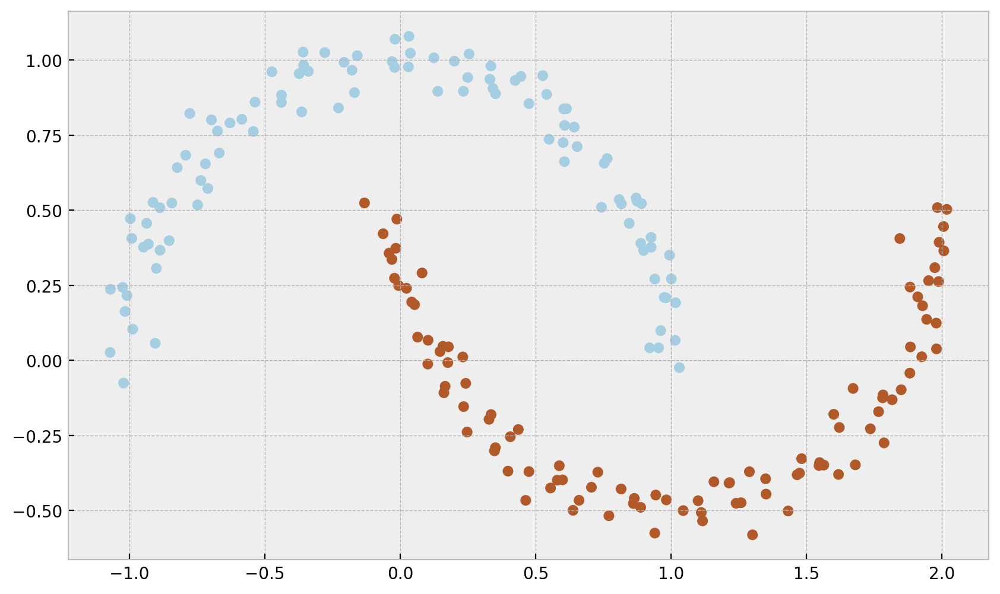

In [242]:
from sklearn.datasets import make_moons

X, y = make_moons(200, noise=.05, random_state=0)

plt.scatter(X[:,0], X[:,1], c=y, cmap='Paired');

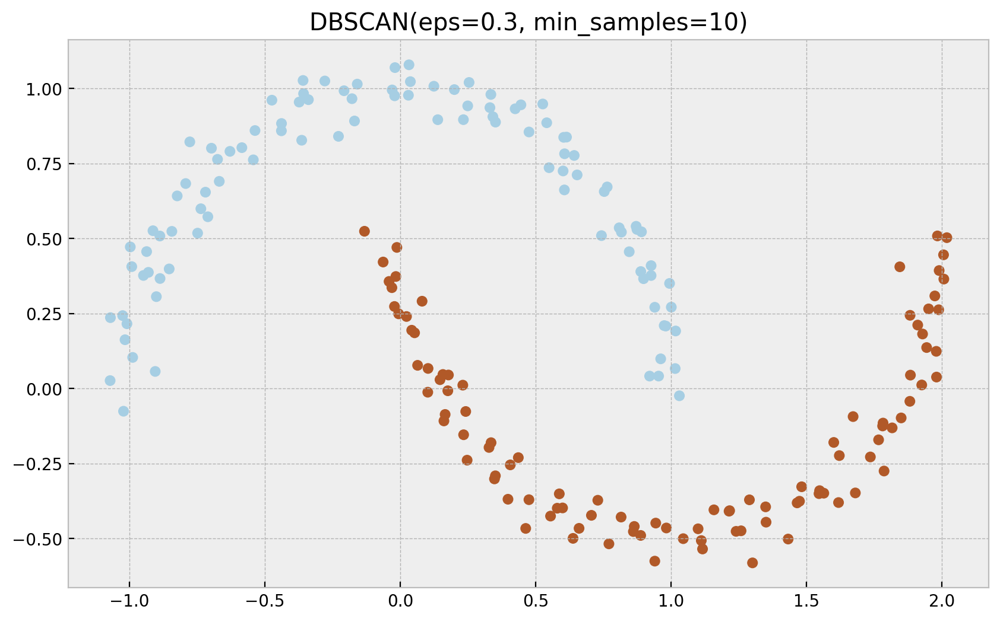

In [244]:
from sklearn.cluster import DBSCAN

model = DBSCAN(eps=0.3, min_samples=10)
labels = model.fit_predict(X)

plt.scatter(X[:,0], X[:,1], c=labels, cmap='Paired')
plt.title(model);

DBSCAN depends heavily on the distance $\epsilon$ and the minimum number of samples required per cluster.

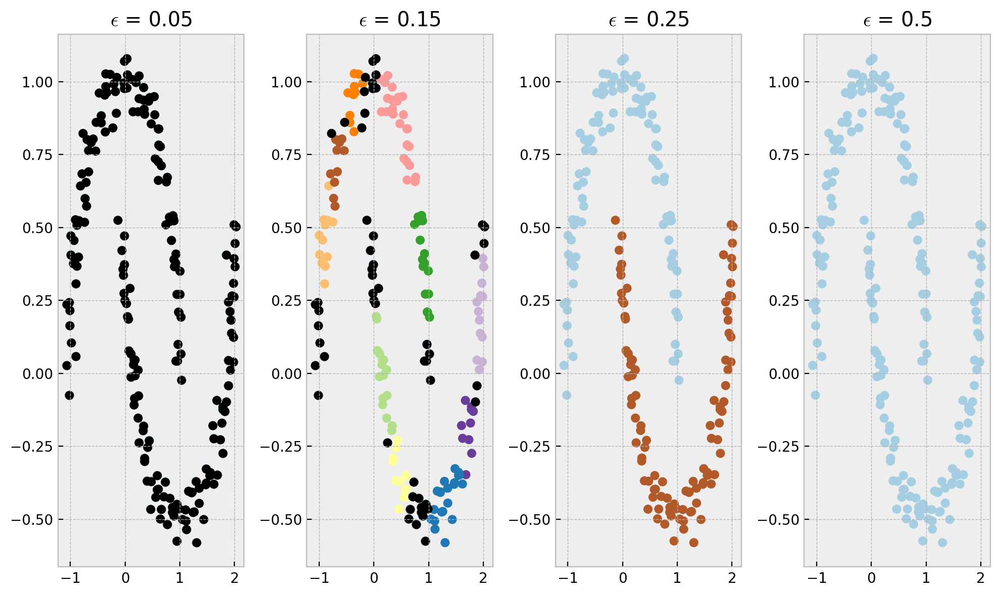

In [255]:
epsilons = [0.05, 0.15, 0.25, 0.5]
for i, epsilon in enumerate(epsilons):
    model = DBSCAN(eps=epsilon, min_samples=10)
    labels = model.fit_predict(X)
    plt.subplot(1, len(epsilons), i+1)
    plt.scatter(X[:,0], X[:,1], c=labels, cmap='Paired')
    outliers = (labels == -1)
    plt.scatter(X[outliers,0], X[outliers,1], c='black')
    plt.title(fr'$\epsilon$ = {epsilon}')
plt.tight_layout();

A label of -1 indicates an outlier not assigned to any cluster.

In [257]:
model = DBSCAN(eps=0.15, min_samples=10)
labels = model.fit_predict(X)

labels

array([ 2,  0, -1, -1,  7, -1,  2, -1,  2,  0,  5, -1,  7,  0,  4,  2,  3,
        8,  3, -1,  6, -1,  3,  0,  5,  1, -1,  6,  1,  3,  2, -1, -1,  1,
        3,  6,  8, -1,  4, -1,  8,  5,  3,  1,  0,  5,  2,  9,  1, -1,  9,
        1,  6, -1,  0,  3,  3,  0,  3,  5,  8, -1,  7,  2,  0, -1, -1,  0,
       -1,  4, -1,  4,  8, -1, -1,  4,  1,  2,  3, -1,  6, -1, -1, -1, -1,
        5, -1,  5,  8,  6,  3,  2,  6,  9,  6,  7,  7,  8, -1,  1,  0,  6,
       -1, -1,  4, -1, -1,  5,  0,  3,  9, -1, -1,  4,  2,  0,  3,  6,  8,
        2,  2,  9, -1, -1, -1,  9, -1,  1,  0, -1,  2,  9,  4,  1,  0,  7,
        0, -1, -1,  2,  1, -1,  3,  5,  5, -1,  1,  0,  3, -1,  8,  7,  2,
        3,  8, -1,  0,  1,  3,  3,  1,  0,  3,  0,  8,  7,  3, -1,  0, -1,
        3, -1,  4,  4,  1, -1, -1,  9,  9,  3,  0,  4,  6,  7,  6,  3, -1,
       -1,  4,  9,  4,  3,  2,  2, -1, -1,  6,  1,  3,  7])

In [258]:
np.unique(labels)

array([-1,  0,  1,  2,  3,  4,  5,  6,  7,  8,  9])

Silhouette score isn't designed to deal with outliers, so let's use another approach to estimate the optimal value of $\epsilon$.

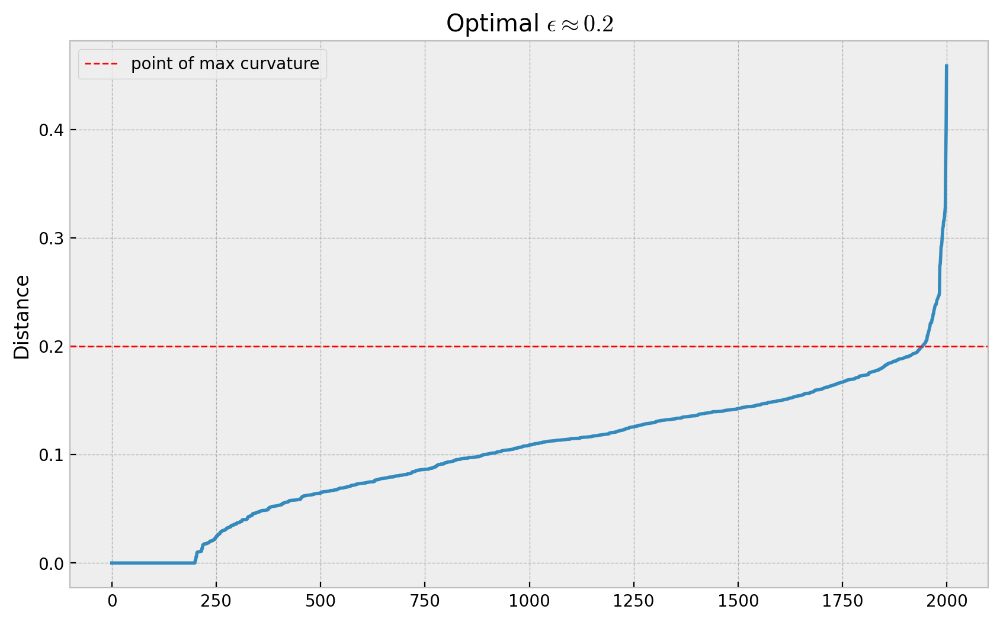

In [259]:
from sklearn.neighbors import NearestNeighbors

# all pairwise distances between closest K neighbors
# typically choose K ~ min_samples
knn = NearestNeighbors(n_neighbors=10)
knn.fit(X)
distances, indices = knn.kneighbors(X)

# sort the distances into one big array
distances = sorted(distances.reshape(-1))

# plot the sorted distances and find the point of maximum curvature
plt.plot(distances)
plt.axhline(0.2, c='r', ls='--', lw=1, label='point of max curvature')
plt.ylabel('Distance')
plt.title(r'Optimal $\epsilon \approx 0.2$')
plt.legend();

See the package `kneed` for automated detection of the max curvature "elbow" or "knee" point.

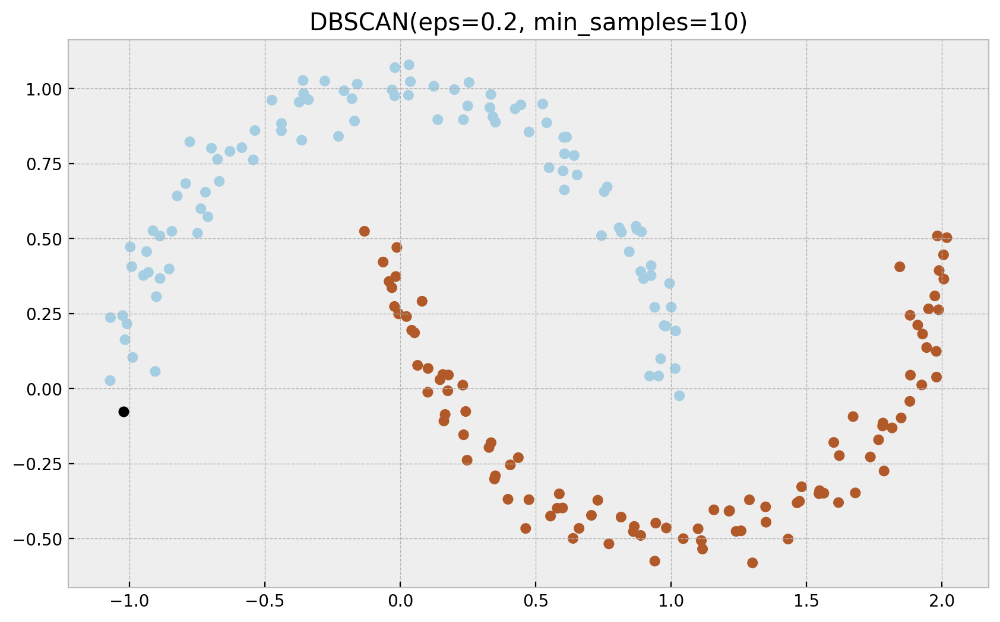

In [262]:
model = DBSCAN(eps=0.2, min_samples=10)
labels = model.fit_predict(X)
outliers = (labels == -1)

plt.scatter(X[~outliers,0], X[~outliers,1], c=labels[~outliers], cmap='Paired')
plt.scatter(X[outliers,0], X[outliers,1], c='black')
plt.title(model);

Let's apply DBSCAN to the APP vs. SOD1 data.

In [266]:
X = df2[['APP_N', 'SOD1_N']]

First, let's estimate the optimal value of $\epsilon$. We'll stick with a minimum of 10 points per cluster.

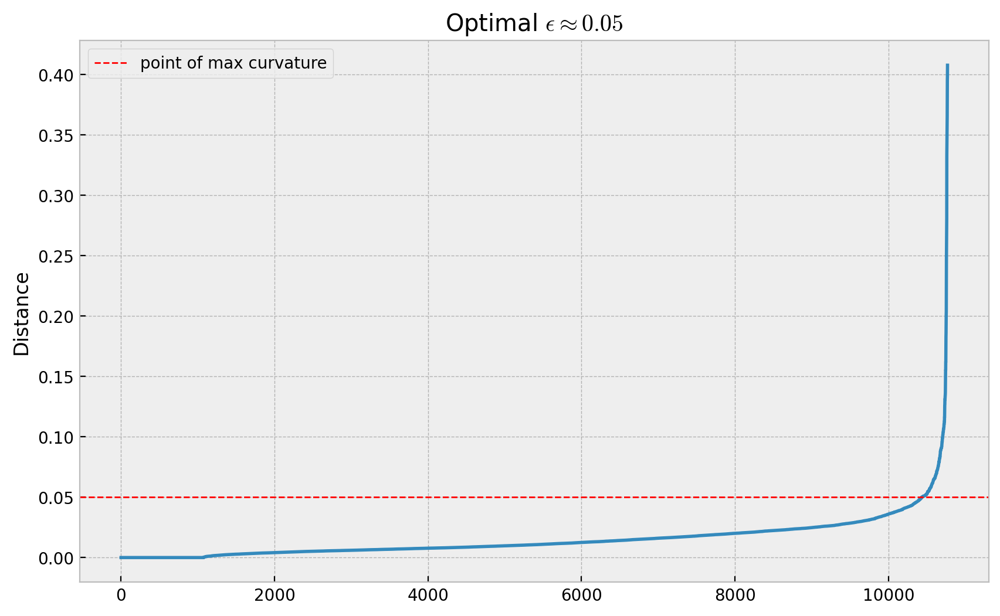

In [282]:
# all pairwise distances between closest K neighbors
# typically choose K ~ min_samples
knn = NearestNeighbors(n_neighbors=10)
knn.fit(X)
distances, indices = knn.kneighbors(X)

# sort the distances into one big array
distances = sorted(distances.reshape(-1))

# plot the sorted distances and find the point of maximum curvature
plt.plot(distances)
plt.axhline(0.05, c='r', ls='--', lw=1, label='point of max curvature')
plt.ylabel('Distance')
plt.title(r'Optimal $\epsilon \approx 0.05$')
plt.legend();

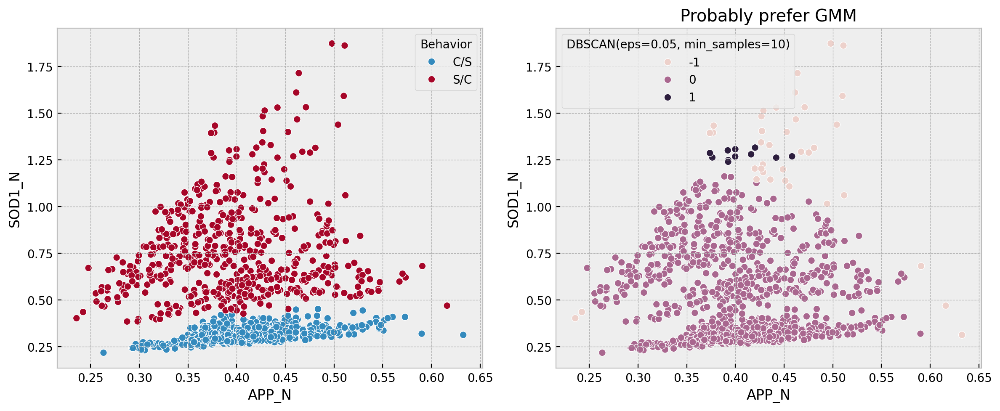

In [281]:
model = DBSCAN(eps=0.05, min_samples=10)
labels = model.fit_predict(X)
outliers = (labels == -1)
df2[model] = labels

fig, ax = plt.subplots(1, 2, figsize=[12,5])
sns.scatterplot(df2, x='APP_N', y='SOD1_N', hue='Behavior', ax=ax[0], palette='tab10')
sns.scatterplot(df2, x='APP_N', y='SOD1_N', hue=model, ax=ax[1], palette='tab10')
ax[1].set_title('Probably prefer GMM')
plt.tight_layout();

Let's use a higher dimensional dataset.

In [288]:
df3 = df.loc[:, 'DYRK1A_N':'class']
cols = df3.isnull().sum() < 10
df3 = df3.loc[:, cols].dropna()
df3

,DYRK1A_N,ITSN1_N,BDNF_N,NR1_N,NR2A_N,pAKT_N,pBRAF_N,pCAMKII_N,pCREB_N,pELK_N,...,Ubiquitin_N,pGSK3B_Tyr216_N,SHH_N,pS6_N,SYP_N,CaNA_N,Genotype,Treatment,Behavior,class
0,0.503644,0.747193,0.430175,2.816329,5.990152,0.218830,0.177565,2.373744,0.232224,1.750936,...,1.044979,0.831557,0.188852,0.106305,0.427099,1.675652,Control,Memantine,C/S,c-CS-m
1,0.514617,0.689064,0.411770,2.789514,5.685038,0.211636,0.172817,2.292150,0.226972,1.596377,...,1.009883,0.849270,0.200404,0.106592,0.441581,1.743610,Control,Memantine,C/S,c-CS-m
2,0.509183,0.730247,0.418309,2.687201,5.622059,0.209011,0.175722,2.283337,0.230247,1.561316,...,0.996848,0.846709,0.193685,0.108303,0.435777,1.926427,Control,Memantine,C/S,c-CS-m
3,0.442107,0.617076,0.358626,2.466947,4.979503,0.222886,0.176463,2.152301,0.207004,1.595086,...,0.990225,0.833277,0.192112,0.103184,0.391691,1.700563,Control,Memantine,C/S,c-CS-m
4,0.434940,0.617430,0.358802,2.365785,4.718679,0.213106,0.173627,2.134014,0.192158,1.504230,...,0.997775,0.878668,0.205604,0.104784,0.434154,1.839730,Control,Memantine,C/S,c-CS-m
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1075,0.254860,0.463591,0.254860,2.092082,2.600035,0.211736,0.171262,2.483740,0.207317,1.057971,...,1.261651,0.962942,0.275547,0.115806,0.374088,1.364823,Ts65Dn,Saline,S/C,t-SC-s
1076,0.272198,0.474163,0.251638,2.161390,2.801492,0.251274,0.182496,2.512737,0.216339,1.081150,...,1.254872,0.983690,0.283207,0.113614,0.375259,1.364478,Ts65Dn,Saline,S/C,t-SC-s
1077,0.228700,0.395179,0.234118,1.733184,2.220852,0.220665,0.161435,1.989723,0.185164,0.884342,...,1.242248,0.976609,0.290843,0.118948,0.422121,1.430825,Ts65Dn,Saline,S/C,t-SC-s
1078,0.221242,0.412894,0.243974,1.876347,2.384088,0.208897,0.173623,2.086028,0.192044,0.922595,...,1.301071,0.989286,0.306701,0.125295,0.397676,1.404031,Ts65Dn,Saline,S/C,t-SC-s


Let's split the mice into two clusters based on their protein expression profiles using a GMM.

In [372]:
X = df3.loc[:, 'DYRK1A_N':'CaNA_N']

# e.g., to correspond to the 2 possible Behavior paradigms
model = GaussianMixture(n_components=2, random_state=0)
labels = model.fit_predict(X)
df3['GMM cluster=2'] = labels

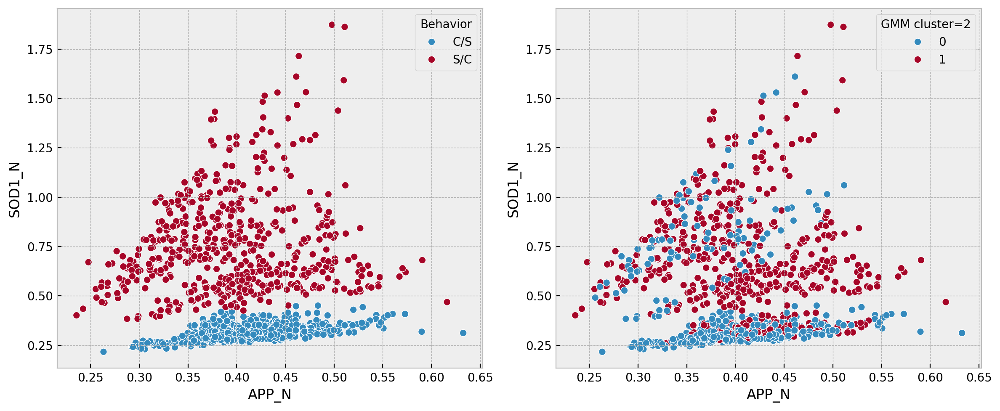

In [373]:
fig, ax = plt.subplots(1, 2, figsize=[12,5])
sns.scatterplot(df3, x='APP_N', y='SOD1_N', hue='Behavior', ax=ax[0], palette='tab10')
sns.scatterplot(df3, x='APP_N', y='SOD1_N', hue='GMM cluster=2', ax=ax[1], palette='tab10')
plt.tight_layout();

In [385]:
df3[['GMM cluster=2', 'Behavior']].groupby(['Behavior', 'GMM cluster=2']).size()

Behavior  GMM cluster=2
C/S       0                382
          1                139
S/C       0                102
          1                450
dtype: int64

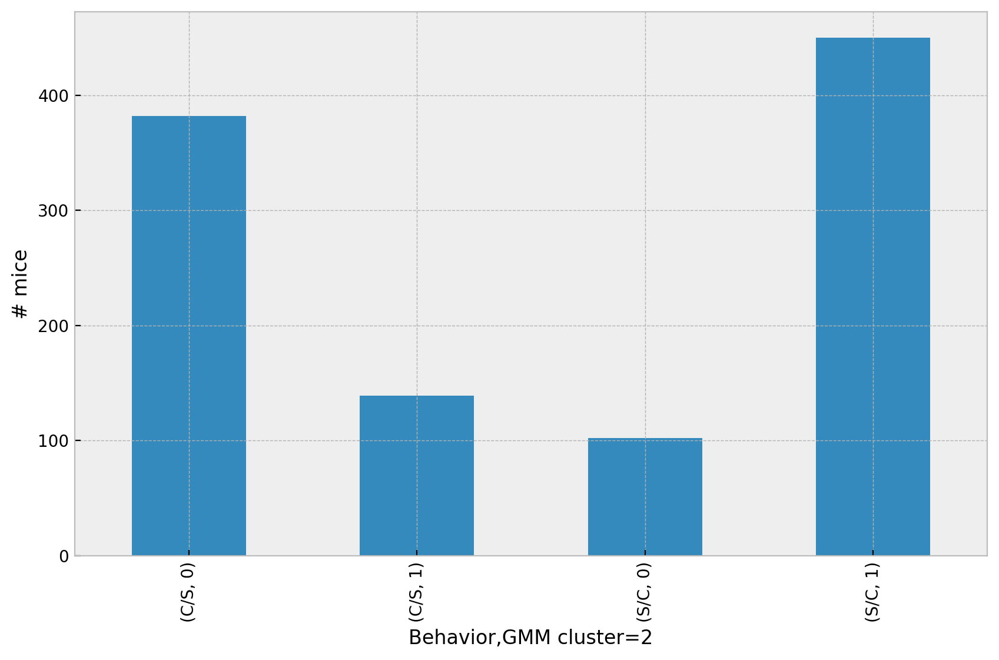

In [386]:
df3[['GMM cluster=2', 'Behavior']].groupby(['Behavior', 'GMM cluster=2']).size().plot.bar()
plt.ylabel('# mice');

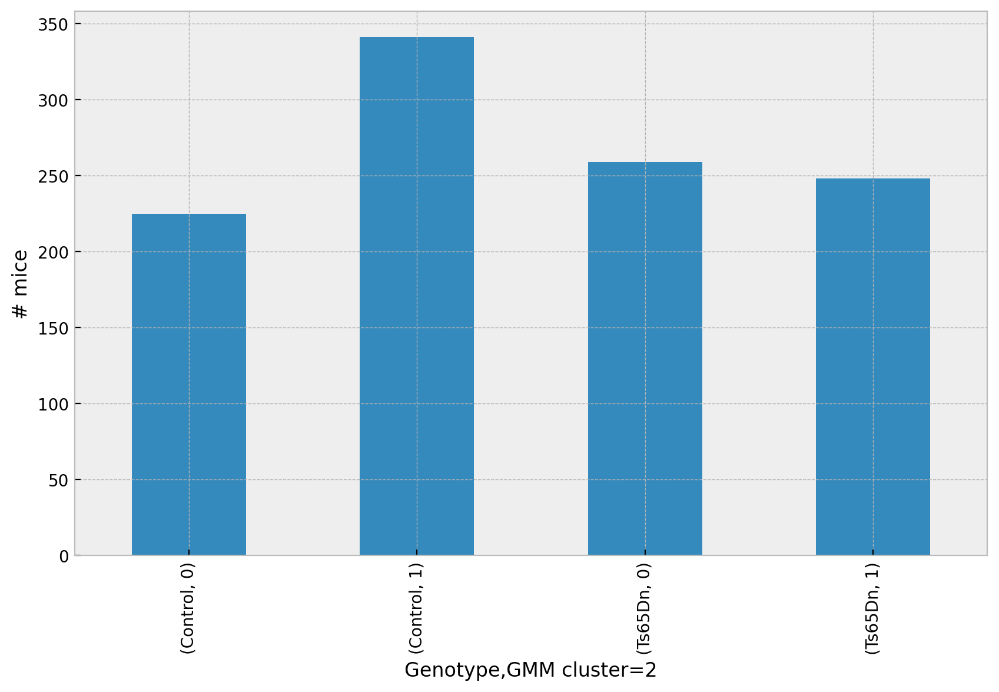

In [387]:
df3[['GMM cluster=2', 'Genotype']].groupby(['Genotype', 'GMM cluster=2']).size().plot.bar()
plt.ylabel('# mice');

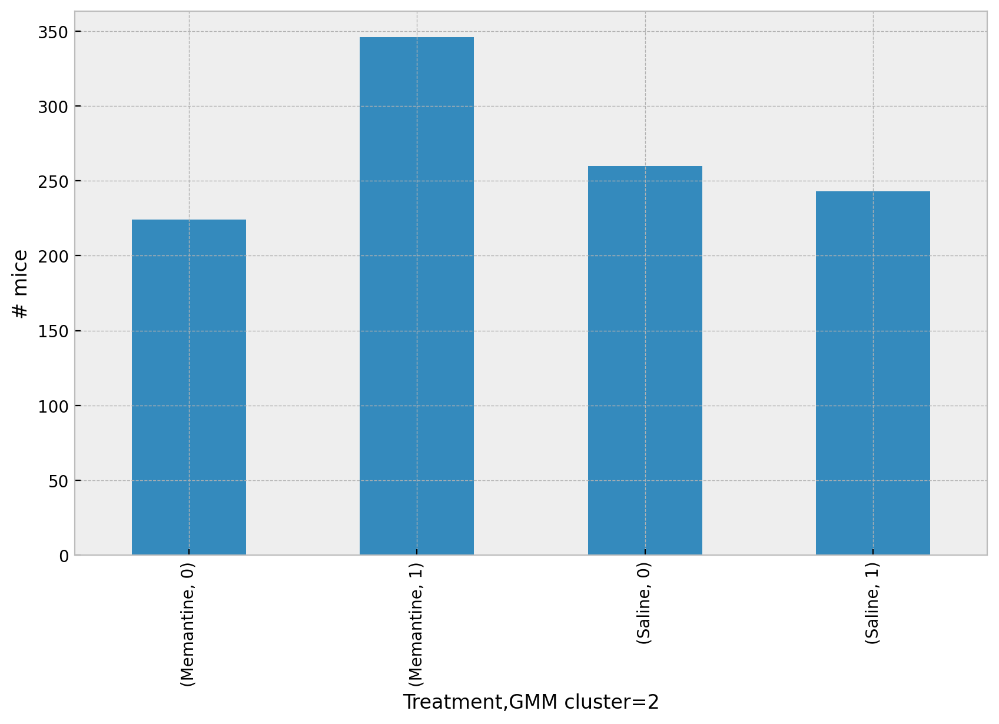

In [388]:
df3[['GMM cluster=2', 'Treatment']].groupby(['Treatment', 'GMM cluster=2']).size().plot.bar()
plt.ylabel('# mice');

In [381]:
# for the 8 possible mouse classes
model = GaussianMixture(n_components=8, random_state=0)
labels = model.fit_predict(X)
df3['GMM cluster=8'] = labels

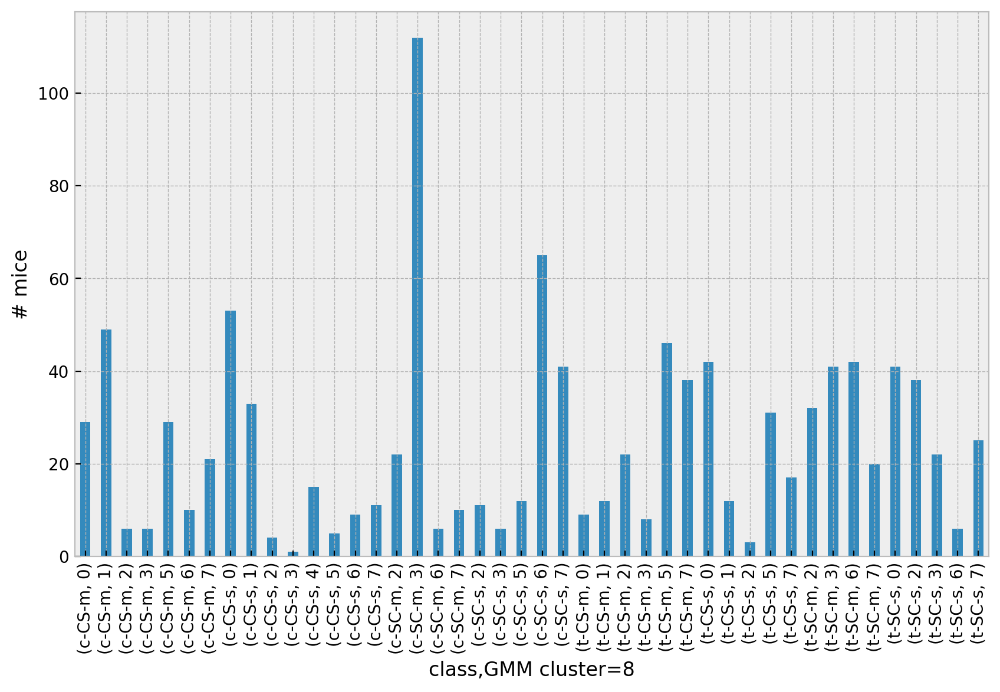

In [384]:
df3[['GMM cluster=8', 'class']].groupby(['class', 'GMM cluster=8']).size().plot.bar()
plt.ylabel('# mice');

### Mean-Shift clustering

1. Start at a random point and specify a radius around that point.
2. Move to the mean of all the points within a specified radius.
3. Repeat 1-2 until converged (point no longer moves).

![mean-shift single window](images/mean-shift_single_window.gif "Mean-Shift Single Window")

Mean-Shift with multiple clusters

* For multiple clusters, start with a grid of points spaced over the entire data.
* Points that converge to locations within their radii are merged.
* Thus, you don't have to specify the numer of clusters, the algorithm will attempt to find the optimal number.
* !!! However, results depend on the selected radius.

![mean-shift many windows](images/mean-shift_many_windows.gif "Mean-Shift Many Windows")

Pros

* Will automatically find the optimal number of clusters.

Cons

* Results highly dependent on the specified search radius.

In [395]:
from sklearn.cluster import MeanShift

X = df2[['APP_N', 'SOD1_N']]

model = MeanShift()
labels = model.fit_predict(X)

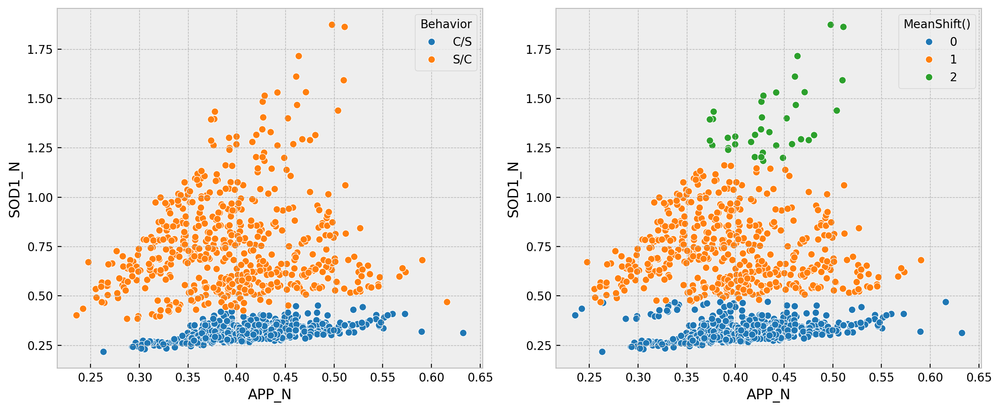

In [396]:
df2[model] = labels

fig, ax = plt.subplots(1, 2, figsize=[12,5])
sns.scatterplot(df2, x='APP_N', y='SOD1_N', hue='Behavior', ax=ax[0], palette='tab10')
sns.scatterplot(df2, x='APP_N', y='SOD1_N', hue=model, ax=ax[1], palette='tab10')
ax[1].set_title('Mean Shift')
plt.tight_layout();

Starting clusters in a uniform grid spaced over the data rather than starting with each data point in its own cluster can be significantly faster for larger datasets

In [27]:
%%timeit
# start with each data point as its own cluster
model = MeanShift()
model.fit(X)
labels = model.predict(X)

1.12 s ± 18.2 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [28]:
%%timeit
# start with uniform grid of clusters spread over data points
model = MeanShift(bin_seeding=True)
model.fit(X)
labels = model.predict(X)

73.3 ms ± 221 µs per loop (mean ± std. dev. of 7 runs, 10 loops each)


Explore changing the radius (bandwidth).

In [397]:
modelA = MeanShift(bandwidth=0.1, bin_seeding=True)
labelsA = modelA.fit_predict(X)

modelB = MeanShift(bandwidth=0.2, bin_seeding=True)
labelsB = modelB.fit_predict(X)

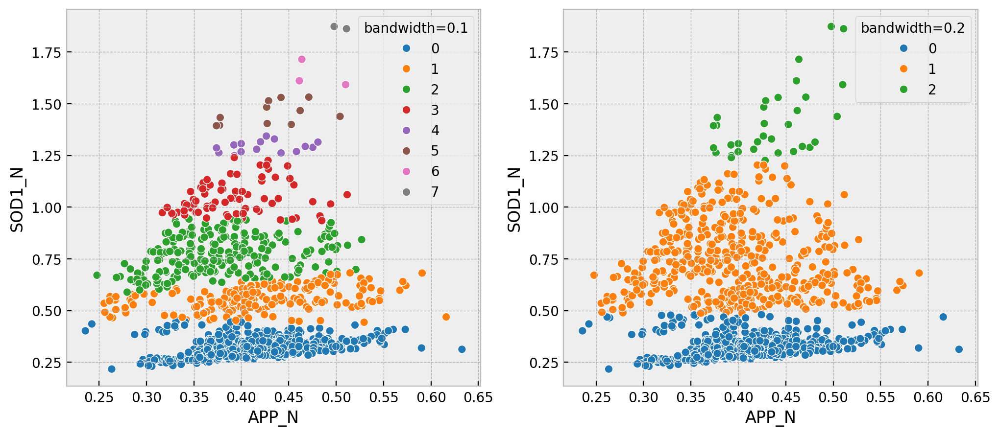

In [399]:
df2['bandwidth=0.1'] = labelsA
df2['bandwidth=0.2'] = labelsB

fig, ax = plt.subplots(1, 2, figsize=[12,5])
sns.scatterplot(df2, x='APP_N', y='SOD1_N', hue='bandwidth=0.1', ax=ax[0], palette='tab10')
sns.scatterplot(df2, x='APP_N', y='SOD1_N', hue='bandwidth=0.2', ax=ax[1], palette='tab10')
ax[0].set_title('Mean Shift')
ax[1].set_title('Mean Shift')
plt.tight_layout();

Estimating the radius (bandwidth) to use based on pairwise distances in the data.

In [400]:
from sklearn.cluster import estimate_bandwidth

# bandwidth estimated from 20% quantile of all pairwise distances
bandwidth = estimate_bandwidth(X, quantile=0.2)
bandwidth

0.13802931661572904

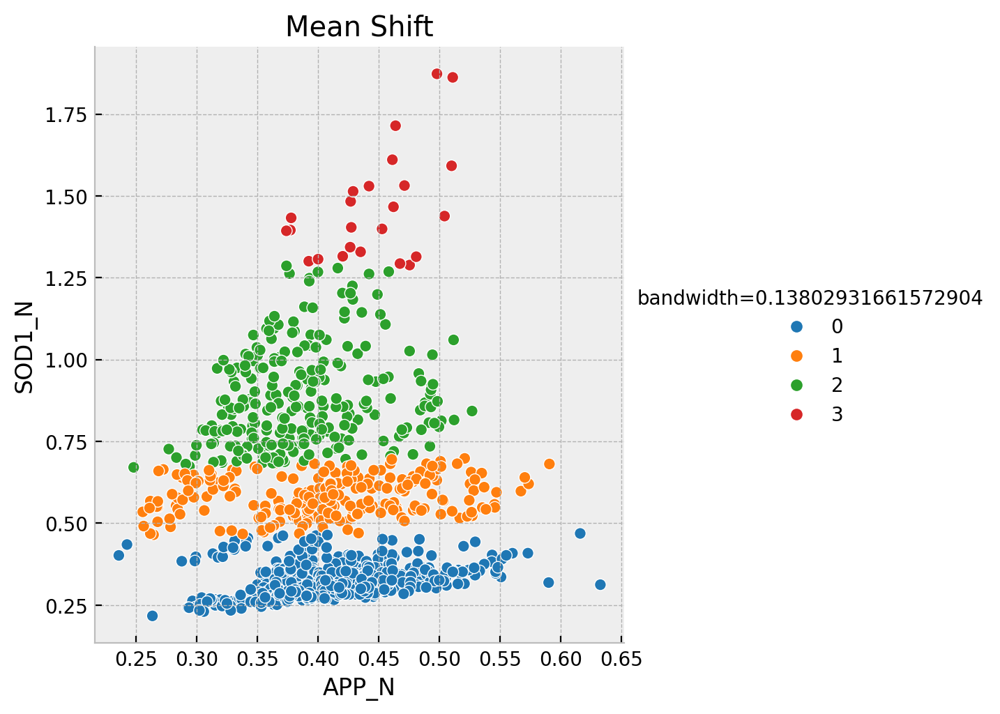

In [406]:
model = MeanShift(bandwidth=bandwidth, bin_seeding=True)
labels = model.fit_predict(X)

df2[f'bandwidth={bandwidth}'] = labels

sns.relplot(df2, x='APP_N', y='SOD1_N', hue=f'bandwidth={bandwidth}', palette='tab10')
plt.title('Mean Shift');

Which bandwidth is best?

You can use a scoring metric like Silhouette score (or Calinski Harabasz score, or Davies Bouldin score) to evaluate how good various bandwidths are.

In [402]:
from sklearn.metrics import calinski_harabasz_score, davies_bouldin_score

X = df2[['APP_N', 'SOD1_N']]

bandwidths = np.arange(0.05, 0.5, 0.05)
silhouette_scores = []
calinski_harabasz_scores = []
davies_bouldin_scores = []

for r in bandwidths:
    model = MeanShift(bandwidth=r, bin_seeding=True)
    labels = model.fit_predict(X)
    if len(np.unique(labels)) == 1:
        break
    silhouette_scores.append(silhouette_score(X, labels))
    calinski_harabasz_scores.append(calinski_harabasz_score(X, labels))
    davies_bouldin_scores.append(davies_bouldin_score(X, labels))

bandwidths = bandwidths[:len(silhouette_scores)]

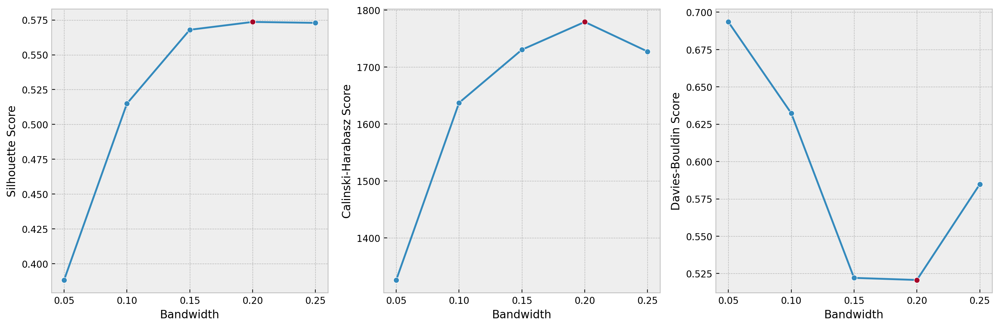

In [403]:
# bandwidth vs. scores
plt.figure(figsize=[15,5])
plt.subplot(1 ,3, 1)
plt.plot(bandwidths, silhouette_scores, 'o-', label='silhouette')
best_ind = np.argmax(silhouette_scores)
plt.plot(bandwidths[best_ind], silhouette_scores[best_ind], 'o-')
plt.xticks(bandwidths)
plt.xlabel('Bandwidth')
plt.ylabel('Silhouette Score')
plt.subplot(1, 3, 2)
plt.plot(bandwidths, calinski_harabasz_scores, 'o-', label='calinski-harabasz')
best_ind = np.argmax(calinski_harabasz_scores)
plt.plot(bandwidths[best_ind], calinski_harabasz_scores[best_ind], 'o-')
plt.xticks(bandwidths)
plt.xlabel('Bandwidth')
plt.ylabel('Calinski-Harabasz Score')
plt.subplot(1, 3, 3)
plt.plot(bandwidths, davies_bouldin_scores, 'o-', label='davies-bouldin')
best_ind = np.argmin(davies_bouldin_scores)
plt.plot(bandwidths[best_ind], davies_bouldin_scores[best_ind], 'o-')
plt.xticks(bandwidths)
plt.xlabel('Bandwidth')
plt.ylabel('Davies-Bouldin Score')
# plt.legend()
plt.tight_layout();

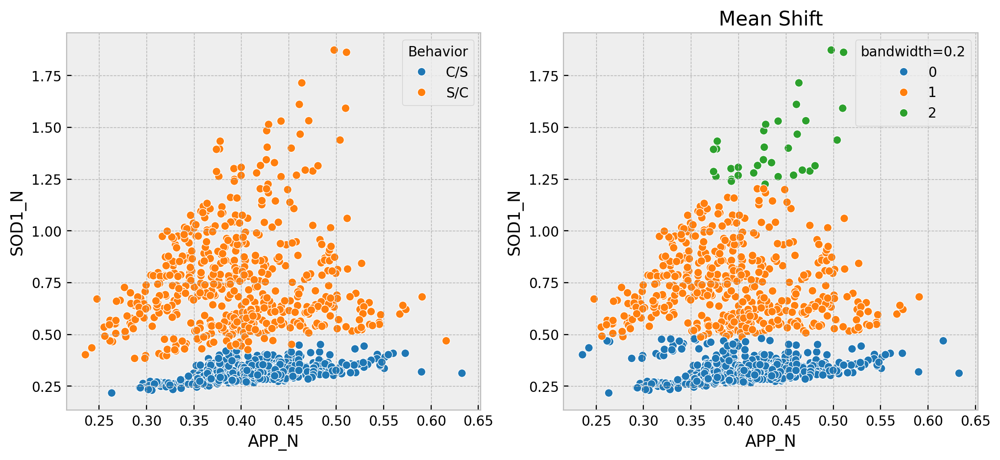

In [405]:
model = MeanShift(bandwidth=0.2, bin_seeding=True)
labels = model.fit_predict(X)

df2['bandwidth=0.2'] = labels

fig, ax = plt.subplots(1, 2, figsize=[12,5])
sns.scatterplot(df2, x='APP_N', y='SOD1_N', hue='Behavior', ax=ax[0], palette='tab10');
sns.scatterplot(df2, x='APP_N', y='SOD1_N', hue='bandwidth=0.2', ax=ax[1], palette='tab10')
ax[1].set_title('Mean Shift')
plt.tight_layout();

### Heirarchical Agglomerative clustering

Start with all data points in separate clusters and iteravely combine the closest clusters together. 

![HAC](images/hac.gif "HAC")

* **affinity**: How to compute distances.
    * **euclidean** is the standard measure of distance you are all familiar with.
    * **manhattan** is distance on a grid like walking city blocks
    * etc.
* **linkage**: How to decide which two clusters to merge next. Always choose to merge the two clusters that minimize the linkage.
    * **ward** minimizes the variance of the clusters being merged.
    * **average** uses the average of the distances of each observation of the two sets.
    * **complete** or maximum linkage uses the maximum distances between all observations of the two sets.
    * **single** uses the minimum of the distances between all observations of the two sets.

In [412]:
from sklearn.cluster import AgglomerativeClustering

X = df2[['APP_N', 'SOD1_N']]

model = AgglomerativeClustering(n_clusters=3, metric='euclidean', linkage='ward')
labels = model.fit_predict(X)

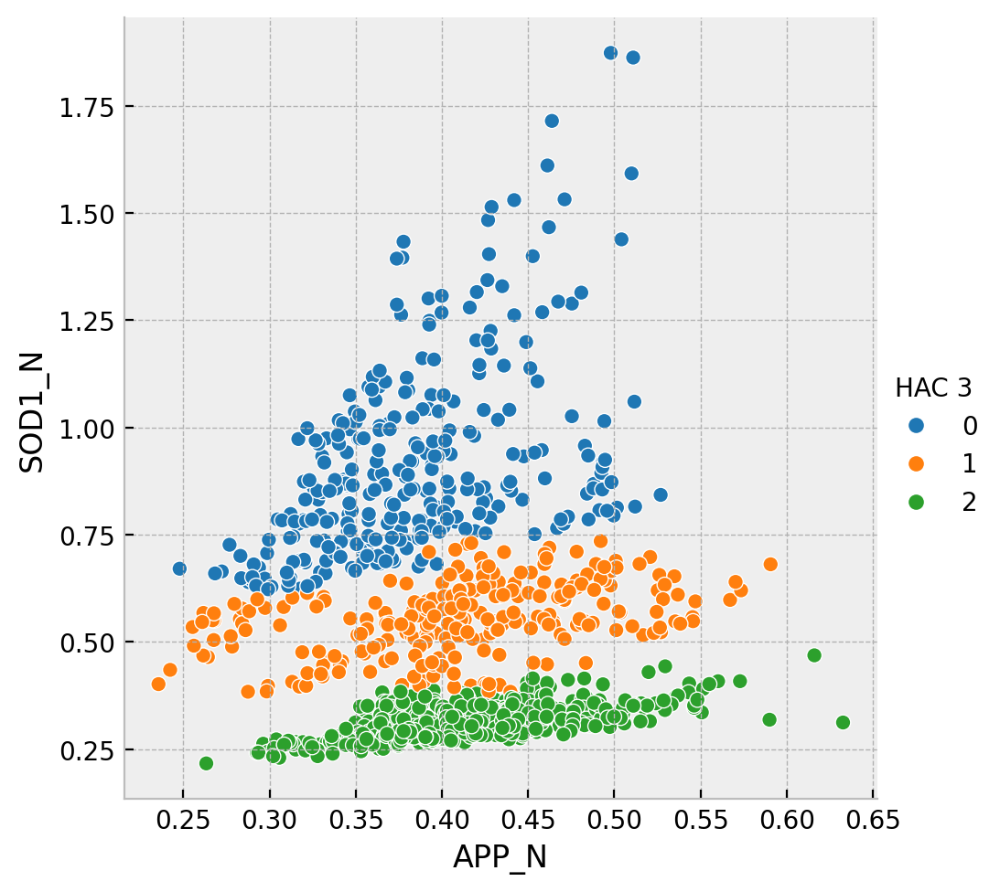

In [414]:
df2['HAC 3'] = labels
sns.relplot(df2, x='APP_N', y='SOD1_N', hue='HAC 3', palette='tab10');

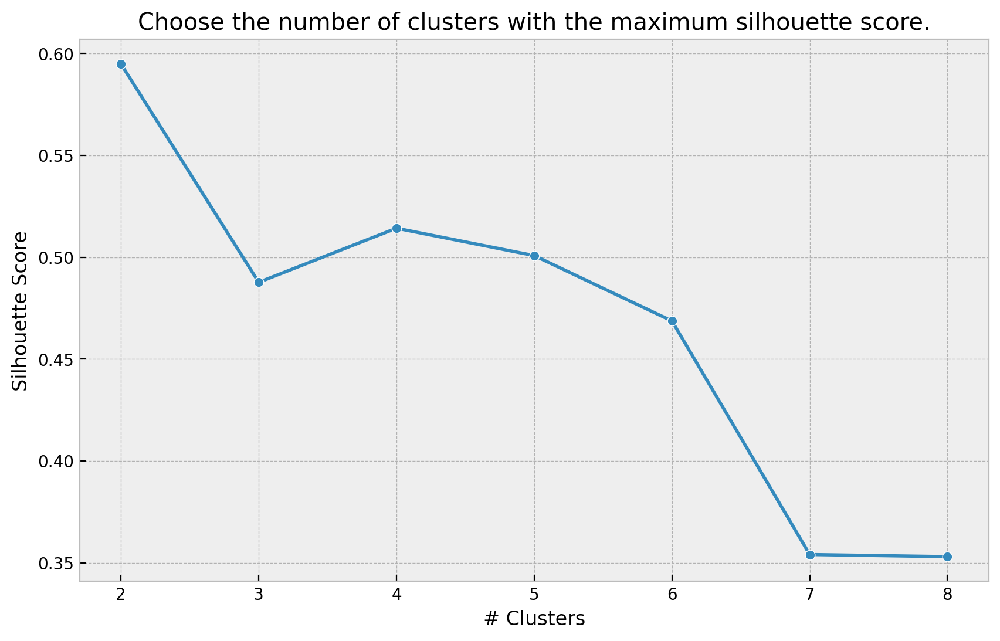

In [411]:
n_clusters = np.arange(2, 9)
scores = []

for n in n_clusters:
    model = AgglomerativeClustering(n_clusters=n, metric='euclidean', linkage='ward')
    labels = model.fit_predict(X)
    score = silhouette_score(X, labels)
    scores.append(score)

plt.plot(n_clusters, scores, 'o-')
plt.xlabel('# Clusters')
plt.ylabel('Silhouette Score')
plt.title('Choose the number of clusters with the maximum silhouette score.');

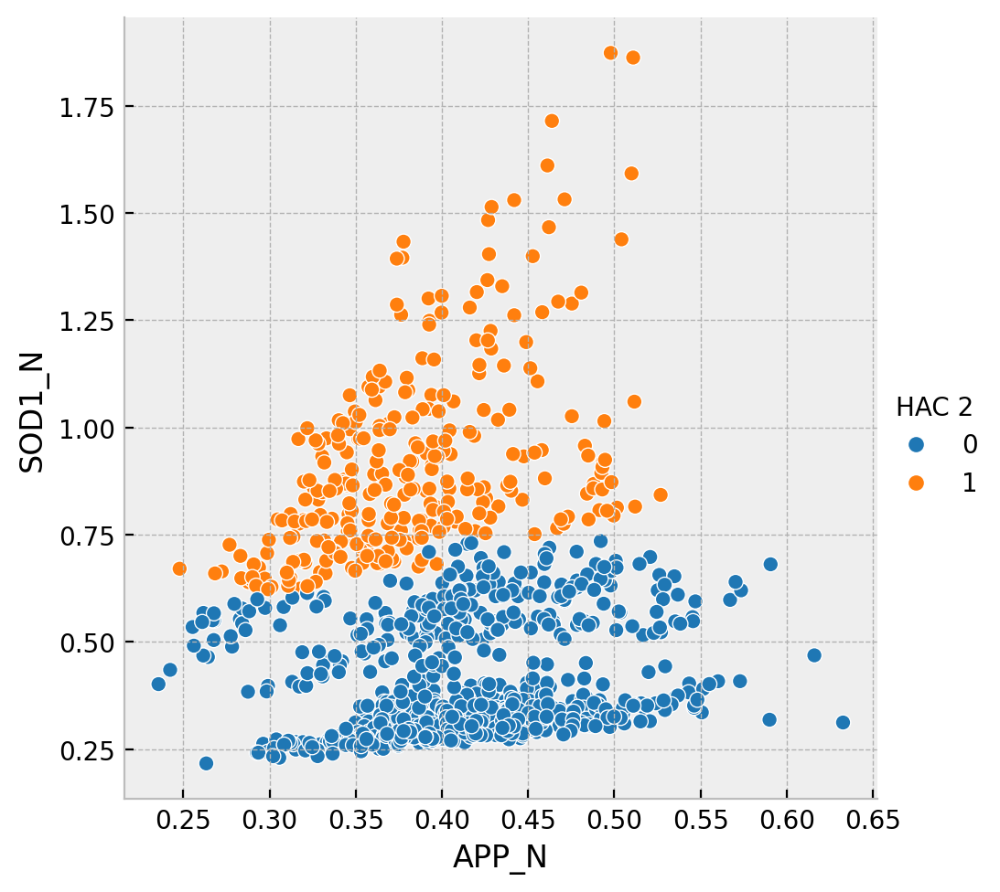

In [415]:
model = AgglomerativeClustering(n_clusters=2, metric='euclidean', linkage='ward')
labels = model.fit_predict(X)

df2['HAC 2'] = labels
sns.relplot(df2, x='APP_N', y='SOD1_N', hue='HAC 2', palette='tab10');

The type of distance metric and linkage method can matter a lot!

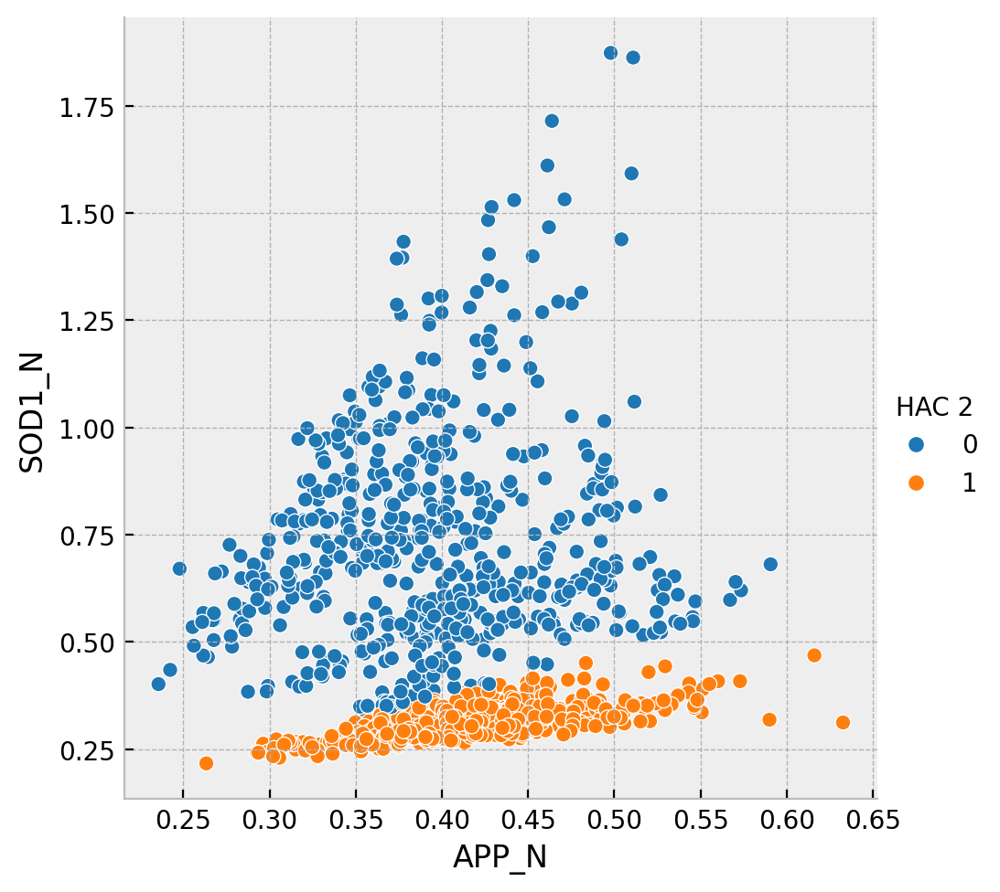

In [431]:
model = AgglomerativeClustering(n_clusters=2, metric='cosine', linkage='average')
labels = model.fit_predict(X)

df2['HAC 2'] = labels
sns.relplot(df2, x='APP_N', y='SOD1_N', hue='HAC 2', palette='tab10');

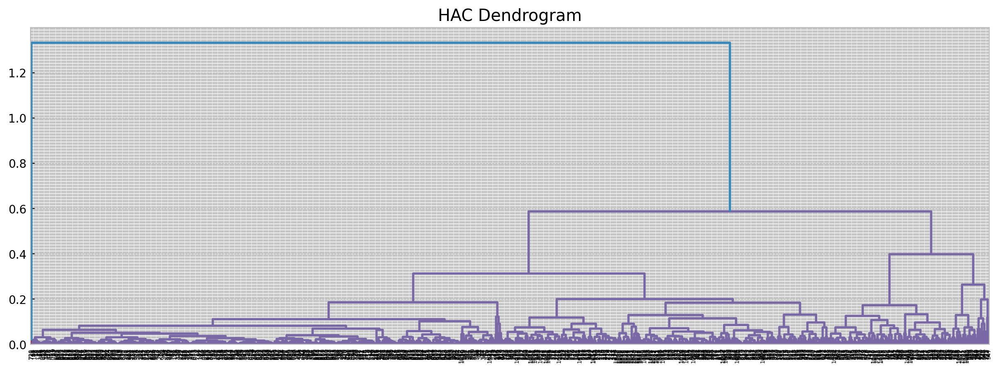

In [432]:
import scipy.cluster.hierarchy as sch

plt.figure(figsize=[15,5])
sch.dendrogram(sch.linkage(X, method='average'));
plt.title('HAC Dendrogram');